## Combine Data from all NF-kB knockdown experiments

Analyze global run on Cellranger v6 data and create h5_ad files for further analysis

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import pickle

import math
import matplotlib
from matplotlib import pyplot as plt

from pathlib import Path
import anndata

In [2]:
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams["font.family"] = "Arial"

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')
np.random.seed(1573)   #fix so we can reproduce later

In [4]:
#Path("./figures").mkdir(parents=True, exist_ok=True) # generate figures here
Path("./write").mkdir(parents=True, exist_ok=True) # write h5ad here

In [5]:
results_file = 'write/Nfkb_analysis_all_lanes.h5ad'  # the file that will store the analysis results

In [6]:
library = ["1659-Fosl2.226","1660-Fosl2.752","1661-Fhl2.467","1662-Fhl2.179","1663-Myc.989","1664-Myc.1389","1665-Yap1.735","1666-Yap1.2847","1667-Atf4.1383","1668-Atf4.536","1669-Maff.85","1670-Maff.587","1671-Nfkb2.152","1672-Nfkb2.534","1673-Relb.286","1674-Relb.1795","1675-Onecut2.1799","1676-Onecut2.2361","1810-Slc4a11.541","1934-Slc4a11.1966","1811-Itga2.672","1812-Itga2.204","1998-Cldn4-1013","1999-Cldn4-951","2113-Lif.440","2114-Lif.1890","2115-Fosl1.1401","2116-Fosl1.699","2117-Nfkb1.2331","2118-Nfkb1.3737","shRenilla",'JCP628-shIkbkg-1.2526','JCP629-shIkbkg-2.2984',
           'JCP618-shRela-1.1202','JCP621-shRela-4.1182','JCP623-shRel-1.1868',
           'JCP625-shRel-3.342','Ikbsr-FLAG',]

In [7]:
adata_A = sc.read_h5ad('../JC2434/write/JC2434-allmice-tumor.h5ad')
adata_B = sc.read_h5ad('../JC2438/write/JC2438-allmice-tumor.h5ad')
adata_C = sc.read_h5ad('../IGO15770/write/IGO15770-allmice-tumor.h5ad')
adata_D = sc.read_h5ad('../JC2499/write/JC2499_allmice-tumor.h5ad')

In [8]:
adatas = [adata_A, adata_B, adata_C, adata_D]

In [9]:
samples = set(adata_A.obs.Classification.value_counts().index) | set(adata_B.obs.Classification.value_counts().index) | set(adata_C.obs.Classification.value_counts().index) | set(adata_D.obs.Classification.value_counts().index)

In [10]:
print(samples)

{'AY1264_B0301', 'AY1263_B0307', 'BE1662_B0311', 'AX1598_2117', 'BE1155_(BD1672)_B0302', 'BE1137_B0304', 'BD1939_B0303', 'AY1484_B0310', 'AW1552_2117', 'BE1139_B0307', 'AX1128_Renilla', 'AW1725_Renilla', 'AW1426_Renilla', 'AY1262_B0306', 'AY1268_B0303', 'BE1490_B0309', 'BE1140-NT_B0308', 'AX1672_2118', 'AW1427_Renilla', 'AY1483_B0309', 'BE1156_(BD1671)_B0301', 'AY1267_B0302', 'BE1491-NT_B0310', 'BD1941_B0306', 'BF1240_(BE1834)_B0312', 'AY1271_B0305', 'AX1508_2117', 'BE1157_(BD1674)_B0305', 'BF1087_B0313', 'AX1123_2118', 'AW1555_2118', 'AY1425_B0308', 'AY1422_B0304'}


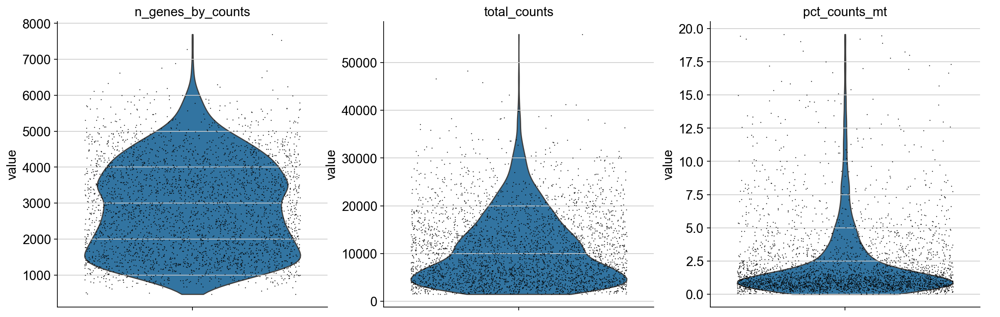

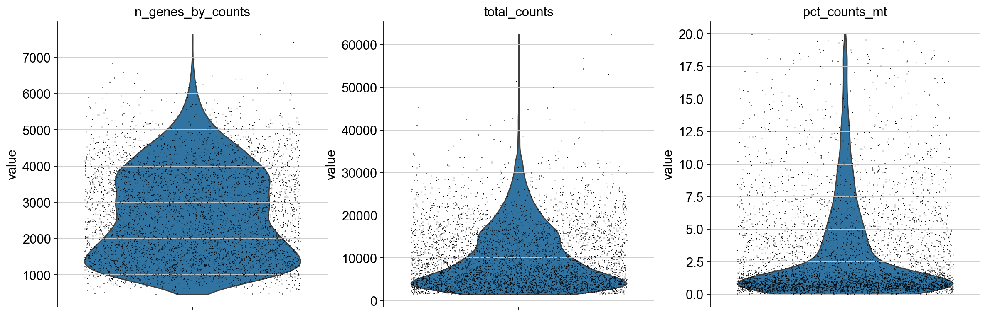

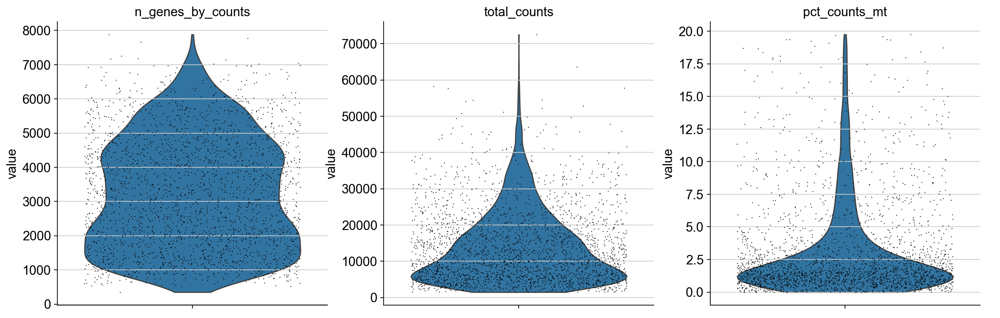

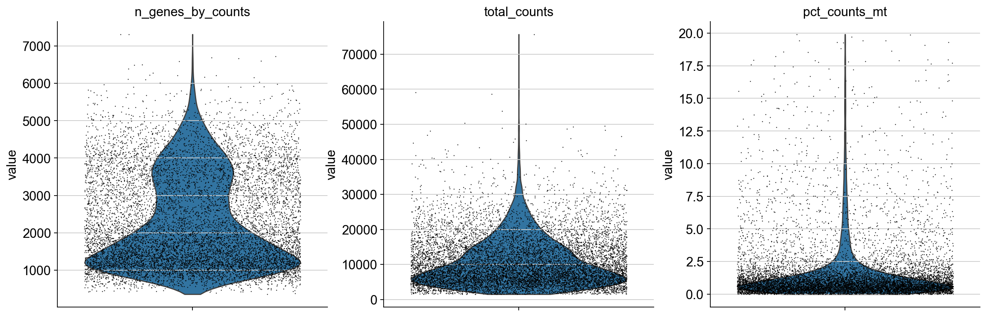

In [11]:
for x in range(0, len(adatas)):
    sc.pl.violin(adatas[x], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
                 jitter=0.4, multi_panel=True, rotation=90) #groupby='Classification',

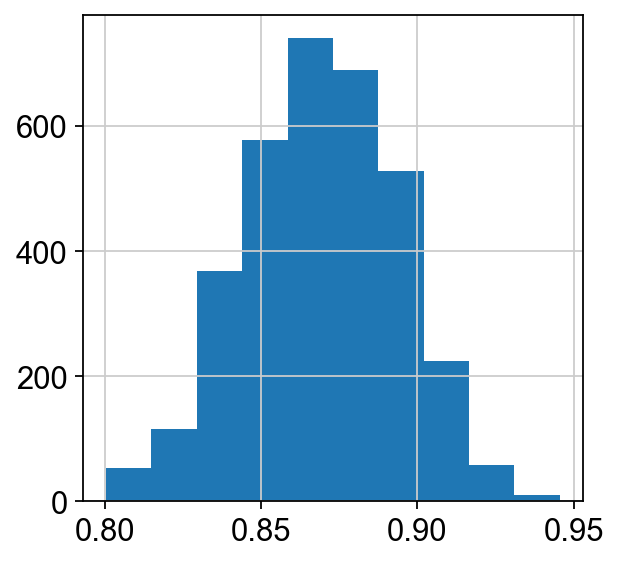

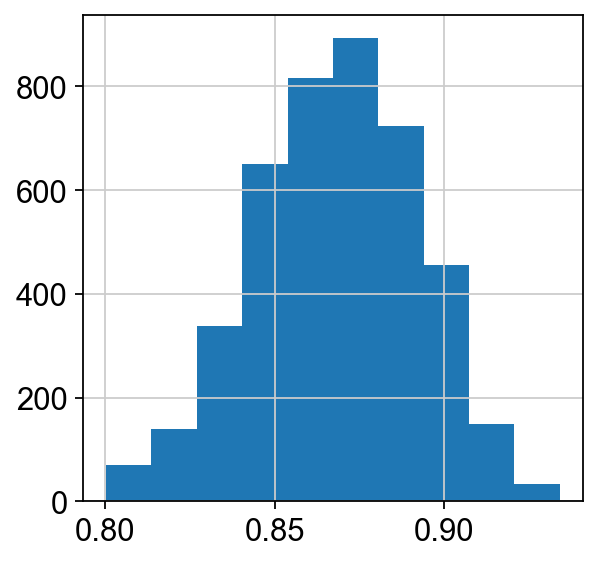

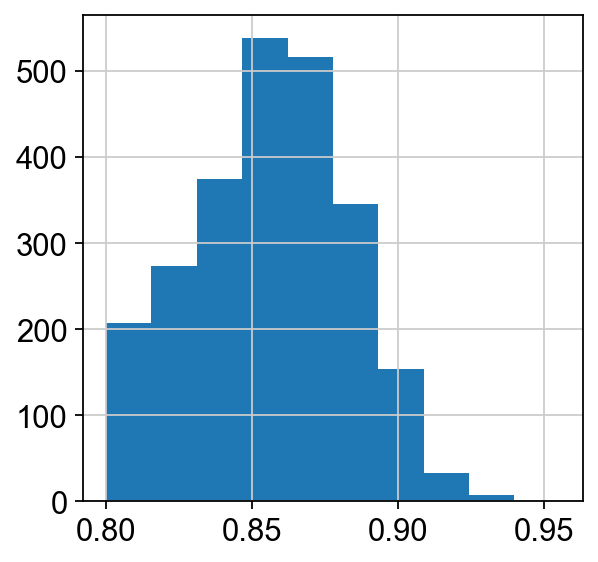

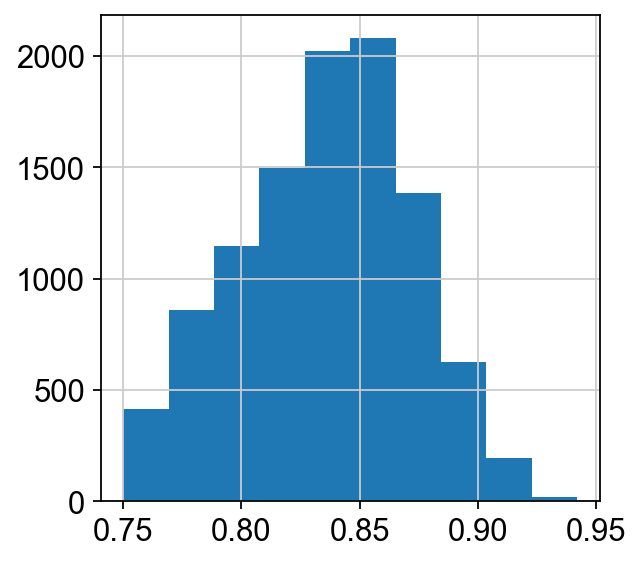

In [12]:
for x in range(0, len(adatas)):
    adatas[x].obs["log10GenesPerUMI"] = adatas[x].obs['n_genes_by_counts'].apply(math.log10) / adatas[x].obs['total_counts'].apply(math.log10)
    matplotlib.pyplot.hist(adatas[x].obs["log10GenesPerUMI"])
    matplotlib.pyplot.show()

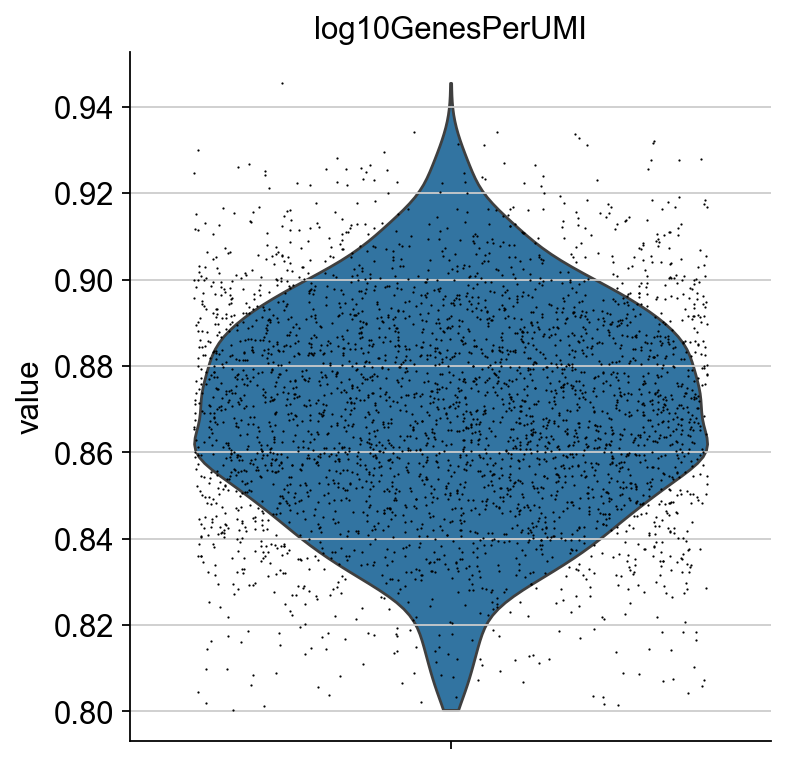

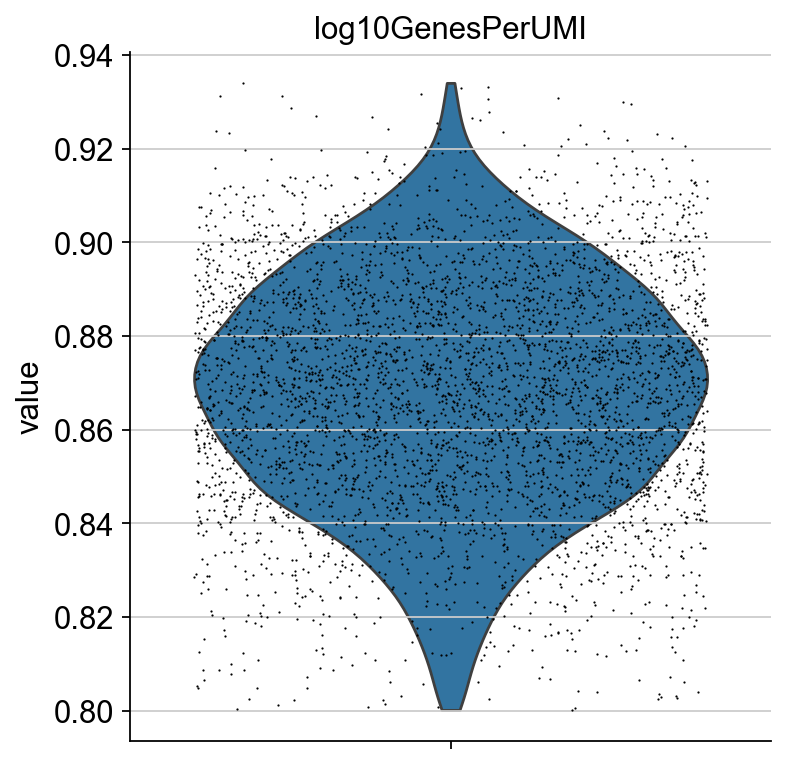

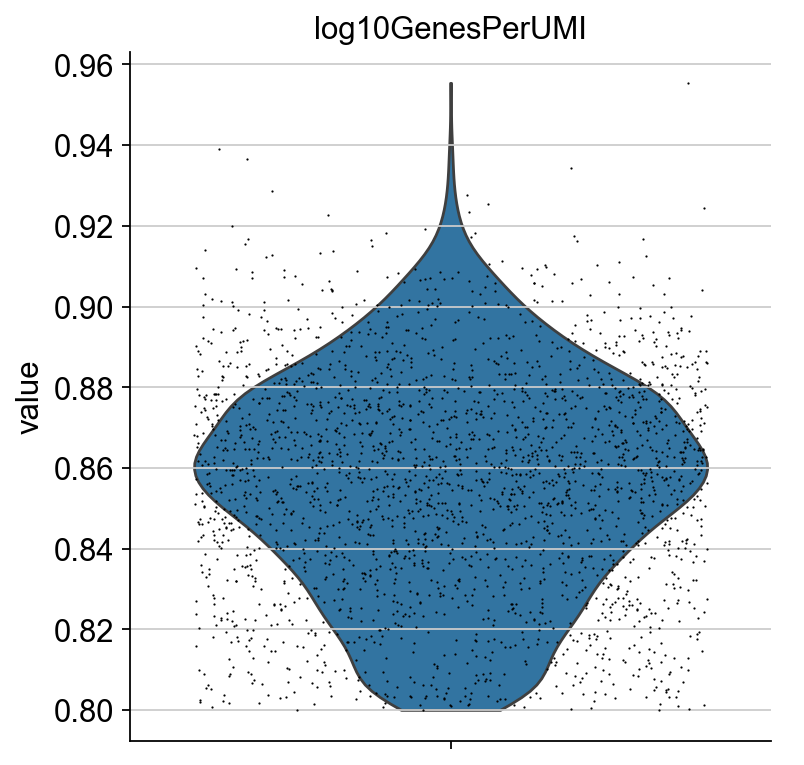

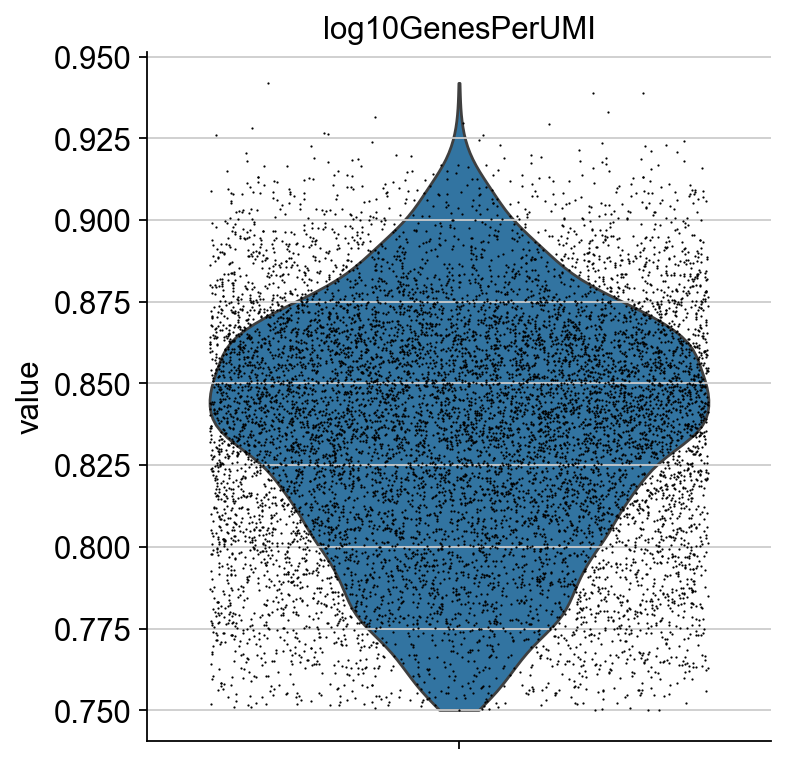

In [13]:
for x in range(0, len(adatas)):
    sc.pl.violin(adatas[x], ['log10GenesPerUMI'],
                 jitter=0.4, multi_panel=True, rotation=90)#groupby='Classification',


## Concatenate adatas

In [14]:
adata = adatas[0].concatenate(adatas[1:], join='outer', batch_categories=['shNfkb1_lane1', 'shNfkb1_lane2','shHairpins','IkbSR-Cre'])

/tmp/ipykernel_3381059/2408911170.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata = adatas[0].concatenate(adatas[1:], join='outer', batch_categories=['shNfkb1_lane1', 'shNfkb1_lane2','shHairpins','IkbSR-Cre'])


In [15]:
adata.uns['log1p'] = {'base': None}

## Identify Cells expressing Transgenes

In [16]:
GFPCells = adata[adata.obs['GFP_count'] >= 2,:].obs.index

In [17]:
CreCells = adata[adata.obs['Cre_count'] >= 2,:].obs.index

## Make h5ad compatible


In [18]:
#Convert all columns in adata.raw.var to string
for col in adata.var.columns:
    series = adata.var[col]
    if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
        adata.var[col] = series.astype(str)

# Fix adata.raw.var
for col in adata.raw.var.columns:
    series = adata.raw.var[col]
    if pd.api.types.is_object_dtype(series):
        adata.raw.var[col] = series.astype(str)

#adata.write_h5ad(results_file, compression='gzip')

/tmp/ipykernel_3381059/301777264.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
/tmp/ipykernel_3381059/301777264.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
/tmp/ipykernel_3381059/301777264.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
/tmp/ipykernel_3381059/301777264.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) 

## Set highly variable genes based only on controls

In [19]:
adata.obs[['batch','Group']].value_counts()

batch          Group       
IkbSR-Cre      Cre             6186
               IkbSR-Cre       4053
shNfkb1_lane2  shRenilla       3056
shNfkb1_lane1  shRenilla       1841
               shNfkb1_2331    1477
shHairpins     shRela           923
shNfkb1_lane2  shNfkb1_2331     887
shHairpins     shRel            640
               shRenilla        489
               shNfkb1          398
shNfkb1_lane2  shNfkb1_3737     327
shNfkb1_lane1  shNfkb1_3737      50
Name: count, dtype: int64

In [20]:
adata_control = adata[adata.obs.Group.isin(['shRenilla','Cre']),:].copy()

In [21]:
sc.pp.highly_variable_genes(adata_control,batch_key='batch')

extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [22]:
adata_control

AnnData object with n_obs × n_vars = 11572 × 30144
    obs: 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', 'shRen', '2118-Nfkb1', '2117-Nfkb1', 'GFP_count', 'Cre_count', 'shRNA', 'Group', 'shRela', 'shRel', 'batch'
    var: 'gene_ids-IkbSR-Cre', 'feature_types-IkbSR-Cre', 'genome-IkbSR-Cre', 'pattern-IkbSR-Cre', 'read-IkbSR-Cre', 'sequence-IkbSR-Cre', 'n_cells-IkbSR-Cre', 'mt-IkbSR-Cre', 'n_cells_by_counts-IkbSR-Cre', 'mean_counts-IkbSR-Cre', 'pct_dropout_by_counts-IkbSR-Cre', 'total_counts-IkbSR-Cre', 'highly_variable-IkbSR-Cre', 'means-IkbSR-Cre', 'dispersions-IkbSR-Cre', 'dispersions_norm-IkbSR-Cre', 'gene_ids-shHairpins', 'feature_types-shHairpins', 'genome-shHairpins', 'pattern-shHairpins', 'read-shHairpins', 'sequence-shHairpins', 'n_cells-shHairpins', 'mt-shHairpins', 'n_cells_by_counts-shHairpins', 'mean_counts-shHairpins', 'pct_dropout_by_counts-shHairpins', 'total_counts-shHairpins', 'highl

In [23]:
# Now use highly variable of the control
adata_control.var.highly_variable = adata_control.var.highly_variable_intersection

In [24]:
adata_control.var.highly_variable['mKate2'] = False
adata_control.var.highly_variable['GFP'] = False
adata_control.var.highly_variable['Cre'] = False
for x in library:
    adata_control.var.highly_variable[x] = False

/tmp/ipykernel_3381059/1445334917.py:1: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  adata_control.var.highly_variable['mKate2'] = False
/tmp/ipykernel_3381059/1445334917.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy 

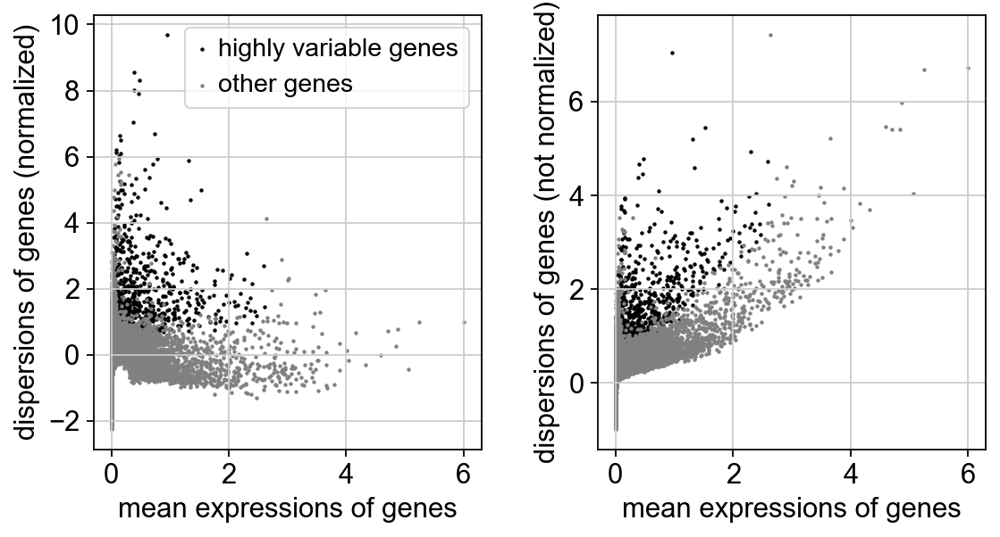

In [25]:
sc.pl.highly_variable_genes(adata_control) # on control genes

In [26]:
adata_control.raw = adata_control

In [27]:
# Convert all columns in adata.raw.var to string, to make this h5ad compatible
for col in adata.var.columns:
    series = adata.var[col]
    if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
        adata.var[col] = series.astype(str)

# Fix adata.raw.var
for col in adata.raw.var.columns:
    series = adata.raw.var[col]
    if pd.api.types.is_object_dtype(series):
        adata.raw.var[col] = series.astype(str)

#adata.write('write/Nfkb_allmice.h5ad', compression='gzip')

/tmp/ipykernel_3381059/1502825870.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
/tmp/ipykernel_3381059/1502825870.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
/tmp/ipykernel_3381059/1502825870.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(series) or pd.api.types.is_object_dtype(series):
/tmp/ipykernel_3381059/1502825870.py:4: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDty

In [28]:
sc.pp.scale(adata_control, max_value=10, layer='counts')

/home/chanj2/part2a/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


## Display Stats

In [29]:
adata_control.obs[['Group','Classification']].value_counts(sort=False)

Group      Classification       
Cre        AY1264_B0301             1511
           AY1267_B0302              555
           AY1268_B0303             1035
           AY1271_B0305             1530
           AY1422_B0304             1555
shRenilla  AW1426_Renilla           1118
           AW1427_Renilla            723
           AW1725_Renilla           2032
           AX1128_Renilla           1024
           BF1087_B0313              474
           BF1240_(BE1834)_B0312      15
Name: count, dtype: int64

## Principal component analysis

In [30]:
sc.tl.pca(adata_control, svd_solver='arpack', n_comps=150)

computing PCA
    with n_comps=150
    finished (0:00:02)


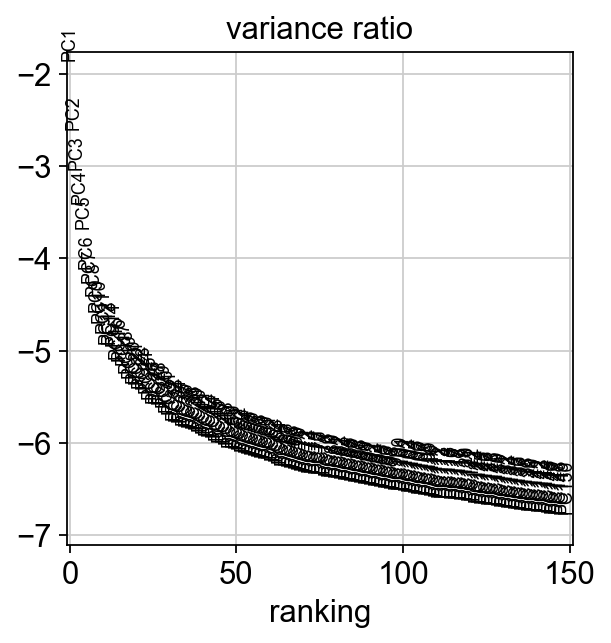

In [31]:
sc.pl.pca_variance_ratio(adata_control, log=True,n_pcs=150)

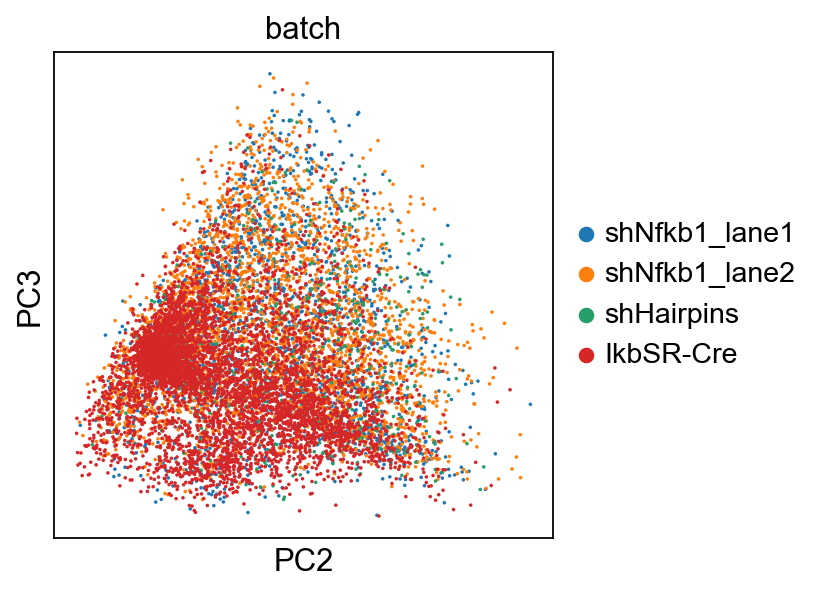

In [32]:
sc.pl.pca(
    adata_control,
    color="batch",   # or "sample_id"
    layer='counts',
    dimensions=(1,2)
)

## Computing the neighborhood graph

In [33]:
sc.pp.neighbors(adata_control, n_neighbors=15, n_pcs=50)

computing neighbors
    using 'X_pca' with n_pcs = 50


/home/chanj2/part2a/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)


## Embedding the neighborhood graph

In [34]:
sc.tl.umap(adata_control)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:10)


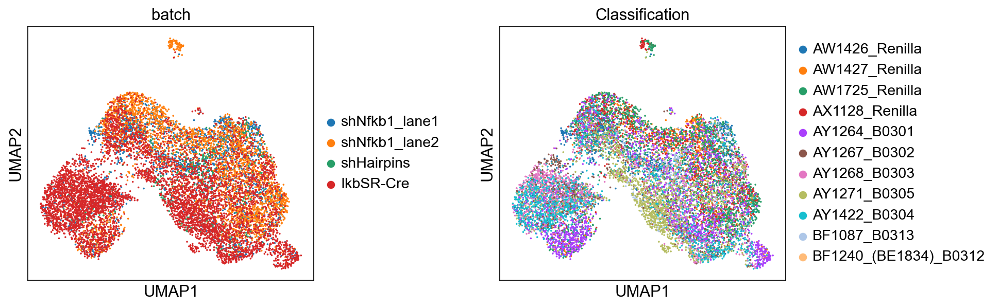

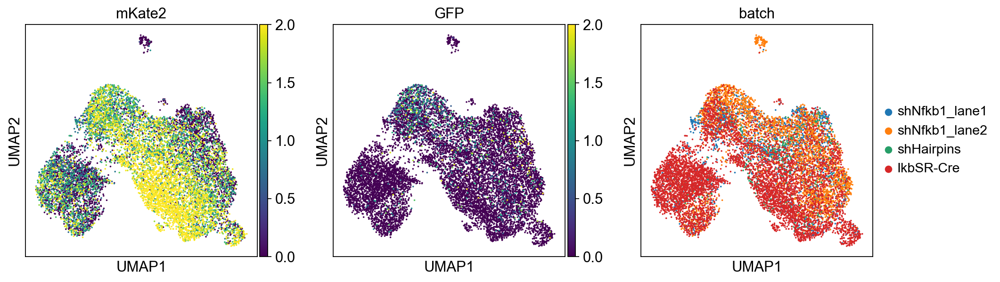

In [35]:
sc.pl.umap(adata_control, color=['batch', 'Classification'],wspace=0.5)
sc.pl.umap(adata_control, color=['mKate2', 'GFP','batch'],vmax=2)#'shRNA'
#sc.pl.umap(adata, color=['Porcn', 'Lgr5','Axin2']) #LGR6 not found
#sc.pl.umap(adata, color=['Vim', 'Cdh2','Cdh1','Epcam']) #CDH1,EPCAM not found
#sc.pl.umap(adata, color=['Slc4a11','Itga2', 'Cldn4'])
#sc.pl.umap(adata, color=['Hopx','Epcam','Sftpc','Pecam1'])
#sc.pl.umap(adata, color=['Cd109', 'Cd81'])
#sc.pl.umap(adata, color=['Trp53','Meg3','Ptprc', 'Kras'], vmax=3)


In [36]:
sc.tl.leiden(adata_control, resolution=0.35)

running Leiden clustering


/tmp/ipykernel_3381059/2558789420.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_control, resolution=0.35)


    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


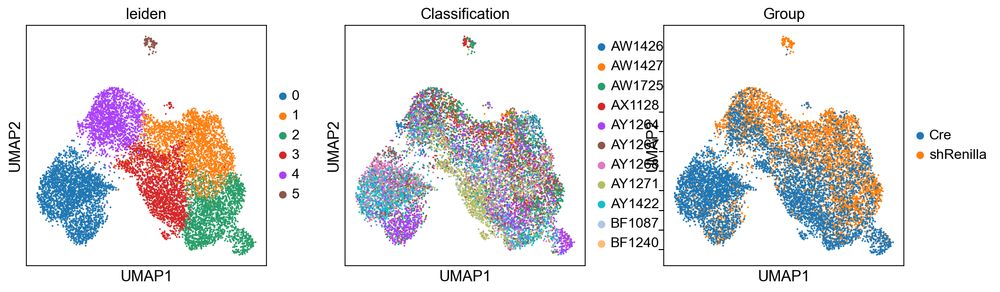

In [37]:
sc.pl.umap(adata_control, color = ['leiden', 'Classification', 'Group'])

## Investigate differences into the different Cluster 5

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


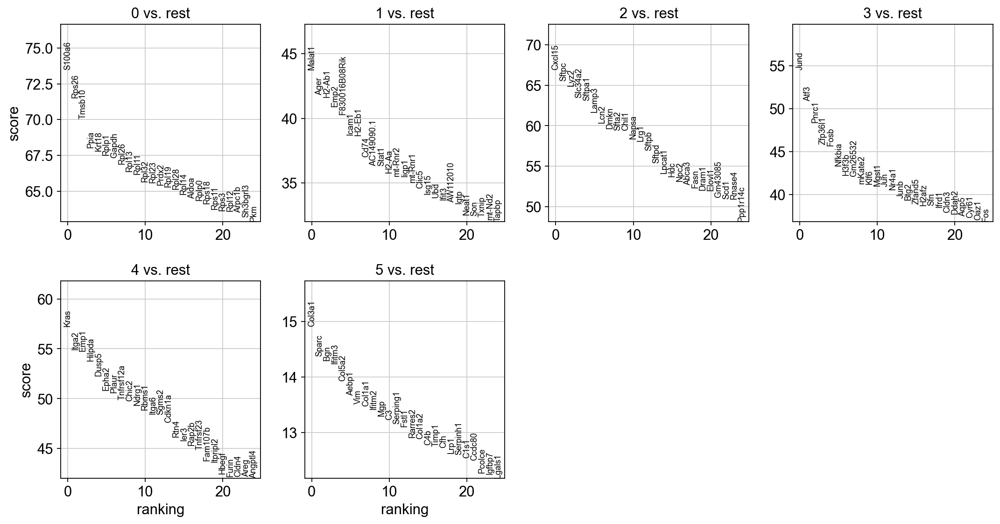

    using 'X_pca' with n_pcs = 150
Storing dendrogram info using `.uns['dendrogram_leiden']`


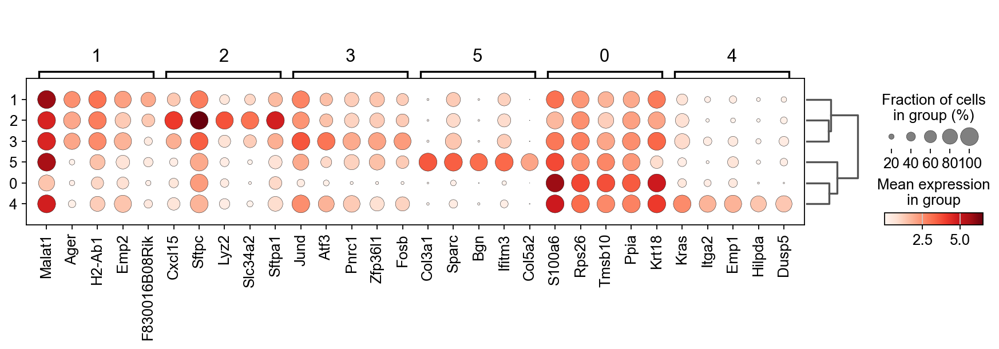

In [38]:
sc.tl.rank_genes_groups(adata_control, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_control, n_genes=25, sharey=False)
sc.pl.rank_genes_groups_dotplot(adata_control, n_genes=5, groupby="leiden")

In [39]:
result = adata_control.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'scores', 'pvals_adj']}).to_excel('write/topGenesall.pvalue.xlsx')
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p
0,S100a6,0.0,Malat1,0.0,Cxcl15,0.0,Jund,0.0,Kras,0.0,Col3a1,2.615702e-50
1,Rps26,0.0,Ager,0.0,Sftpc,0.0,Atf3,0.0,Itga2,0.0,Sparc,7.411447e-47
2,Tmsb10,0.0,H2-Ab1,0.0,Lyz2,0.0,Pnrc1,0.0,Emp1,0.0,Bgn,2.085892e-46
3,Ppia,0.0,Emp2,0.0,Slc34a2,0.0,Zfp36l1,0.0,Hilpda,0.0,Ifitm3,4.929039e-46
4,Krt18,0.0,F830016B08Rik,0.0,Sftpa1,0.0,Fosb,0.0,Dusp5,0.0,Col5a2,4.067038e-44


In [40]:
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(25)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,5_n,5_p
0,S100a6,0.0,Malat1,0.000000e+00,Cxcl15,0.0,Jund,0.000000e+00,Kras,0.0,Col3a1,2.615702e-50
1,Rps26,0.0,Ager,0.000000e+00,Sftpc,0.0,Atf3,0.000000e+00,Itga2,0.0,Sparc,7.411447e-47
2,Tmsb10,0.0,H2-Ab1,0.000000e+00,Lyz2,0.0,Pnrc1,0.000000e+00,Emp1,0.0,Bgn,2.085892e-46
3,Ppia,0.0,Emp2,0.000000e+00,Slc34a2,0.0,Zfp36l1,0.000000e+00,Hilpda,0.0,Ifitm3,4.929039e-46
4,Krt18,0.0,F830016B08Rik,0.000000e+00,Sftpa1,0.0,Fosb,0.000000e+00,Dusp5,0.0,Col5a2,4.067038e-44
5,Rplp1,0.0,Icam1,0.000000e+00,Lamp3,0.0,Nfkbia,0.000000e+00,Epha2,0.0,Aebp1,1.463245e-42
6,Gapdh,0.0,H2-Eb1,0.000000e+00,Lcn2,0.0,H3f3b,0.000000e+00,Plaur,0.0,Vim,1.166405e-41
7,Rpl26,0.0,Cd74,3.581110e-300,Dmkn,0.0,Gm26532,0.000000e+00,Tnfrsf12a,0.0,Col1a1,2.005680e-41
8,Rpl13,0.0,AC149090.1,2.545239e-289,Sfta2,0.0,mKate2,0.000000e+00,Chic2,0.0,Ifitm2,4.670695e-41
9,Rpl11,0.0,Stat1,3.469111e-289,Chil1,0.0,Klf6,0.000000e+00,Ndrg1,0.0,Mgp,2.192582e-40


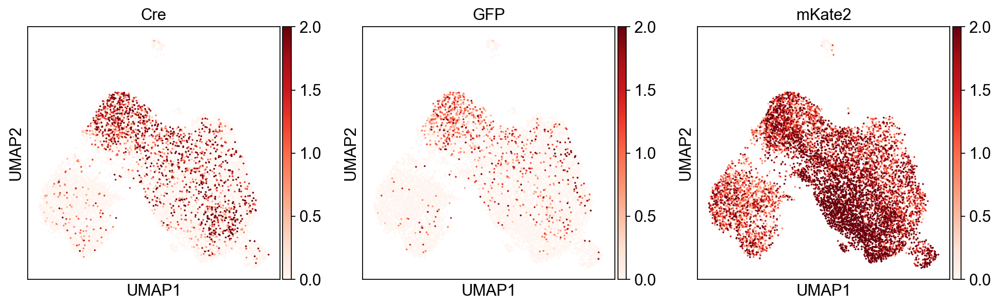

In [41]:
sc.pl.umap(adata_control, color=['Cre','GFP','mKate2'],cmap='Reds',vmax=2)

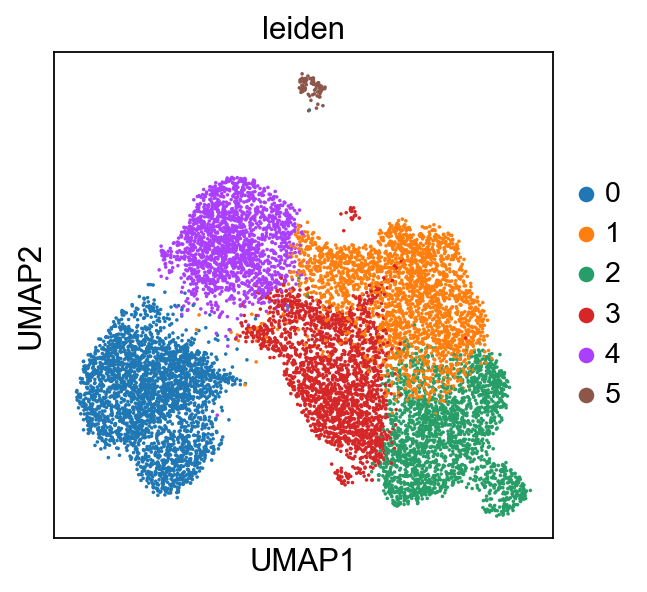

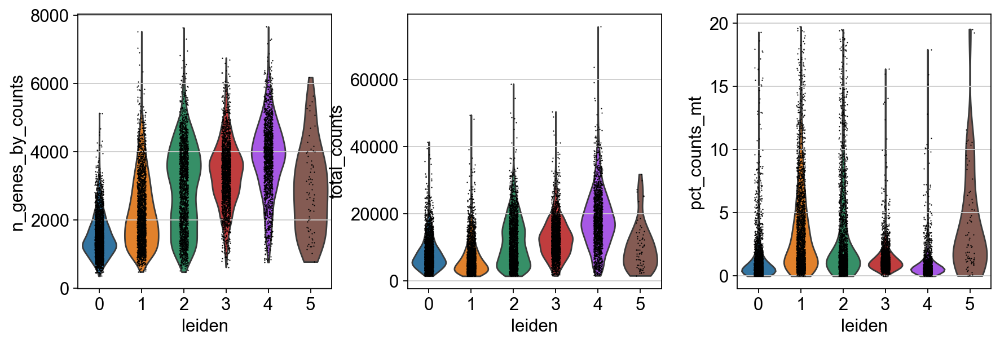

In [42]:
sc.pl.umap(adata_control, color='leiden')
sc.pl.violin(adata_control, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], groupby='leiden')


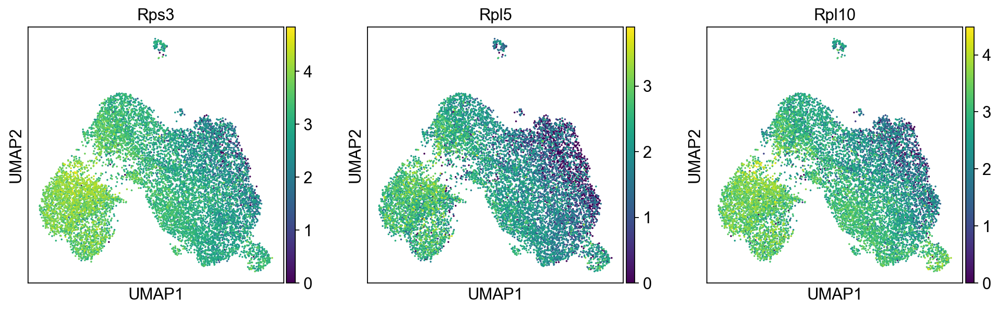

In [43]:
# Based on above, leiden cluster 1 seems to have simple complexity, ribosomally enriched
sc.pl.umap(adata_control, color=['Rps3','Rpl5','Rpl10'], color_map='viridis')


## Define scoring functions

In [44]:
# Score Cluster 5 cells
import csv
clusters = {}
clusterkeys = []
HPCS = False

def resetClusters(hpcs = 'cell2020'):
    clusters = {}
    clusterkeys = []
    HPCS = False
    try:
        if hpcs == 'cell2020':         
            with open('../../common_files/clusters_cell2020.csv',encoding='utf-8-sig') as csvfile:
                csvreader = csv.reader(csvfile, delimiter=",")
                for row in csvreader:
                    clusters[row[0]] = [x for x in row[1:] if x != '']
            for i in range(1,13):
                #if i == 9: continue
                clusterkeys.append('Cluster %i' % i)
            HPCS = 'Cluster 5'
        elif hpcs == 'cell2020_no_Slc4a11':         
            with open('../../common_files/clusters_cell2020.csv',encoding='utf-8-sig') as csvfile:
                csvreader = csv.reader(csvfile, delimiter=",")
                for row in csvreader:
                    clusters[row[0]] = [x for x in row[1:] if x != '']   
                    if 'Slc4a11' in clusters[row[0]]:
                        clusters[row[0]].remove('Slc4a11')
                        print("Slc4a11 removed")
            for i in range(1,13):
                #if i == 9: continue
                clusterkeys.append('Cluster %i' % i)
            HPCS = 'Cluster 5'
        elif hpcs == 'nfkb':         
            with open('../../common_files/hallmark_tnfanfkb.csv',encoding='utf-8-sig') as csvfile:
                csvreader = csv.reader(csvfile, delimiter=",")
                clusters['nfkb'] = [x for row in csvreader for x in row]
            clusterkeys.append('nfkb')
            HPCS = 'nfkb'
        else:
            raise ValueError
    except ValueError:
        print("%s is an invalid choice" % hpcs)
        raise
    return (clusters, clusterkeys, HPCS)

(clusters, clusterkeys, HPCS) = resetClusters('cell2020')

In [45]:
def scoreAndPlot(ad, excludeList = None, groupby="Classification",rotation=90,numgenes=25,ctlgenes=25):
    #cmap = 'Reds' #colormap
    cmap = 'jet' #colormap
    if excludeList == None:
        for i in clusterkeys:
            if (numgenes > ctlgenes):
                ctlgenes = numgenes
            sc.tl.score_genes(ad, clusters[i][0:numgenes],score_name="%s" % i, ctrl_size=ctlgenes)  
        #sc.tl.score_genes(ad, clusters['Highly_mixed'],score_name="Highly_mixed")
  
        sc.pl.umap(ad, color=clusterkeys, color_map=cmap)
        sc.pl.dotplot(ad, clusterkeys, groupby=groupby, swap_axes=True)

In [46]:
from scipy.stats import ranksums

def HPCSViolinPlot(ad, cluster='0', groupby='leiden', score='Cluster5', save=None, singleGene=False):
    ad.obs['Cl5'] = 'not HPCS'
    ad.obs.loc[ad.obs[groupby].isin([cluster]), 'Cl5'] = 'HPCS'

    if singleGene:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray(),ad[~ad.obs['Cl5'].isin(['HPCS'])][:,score].X.toarray())[1]
        #sc.pl.violin(ad, score, groupby='Cl5', xlabel = 'p = ' + str(pvalue), save=save)
    else:
        pvalue = ranksums(ad[ad.obs['Cl5'].isin(['HPCS'])].obs[score],ad[ad.obs['Cl5'].isin(['not HPCS'])].obs[score])[1]
    sc.pl.violin(ad, score, groupby='Cl5', xlabel = 'p = ' + str(pvalue), save=save)

computing score 'Cluster 1'
    finished: added
    'Cluster 1', score of gene set (adata.obs).
    1394 total control genes are used. (0:00:00)
computing score 'Cluster 2'
    finished: added
    'Cluster 2', score of gene set (adata.obs).
    1395 total control genes are used. (0:00:00)
computing score 'Cluster 3'
    finished: added
    'Cluster 3', score of gene set (adata.obs).
    1189 total control genes are used. (0:00:00)
computing score 'Cluster 4'
    finished: added
    'Cluster 4', score of gene set (adata.obs).
    1390 total control genes are used. (0:00:00)
computing score 'Cluster 5'
    finished: added
    'Cluster 5', score of gene set (adata.obs).
    1390 total control genes are used. (0:00:00)
computing score 'Cluster 6'
    finished: added
    'Cluster 6', score of gene set (adata.obs).
    1894 total control genes are used. (0:00:00)
computing score 'Cluster 7'
    finished: added
    'Cluster 7', score of gene set (adata.obs).
    992 total control genes are us

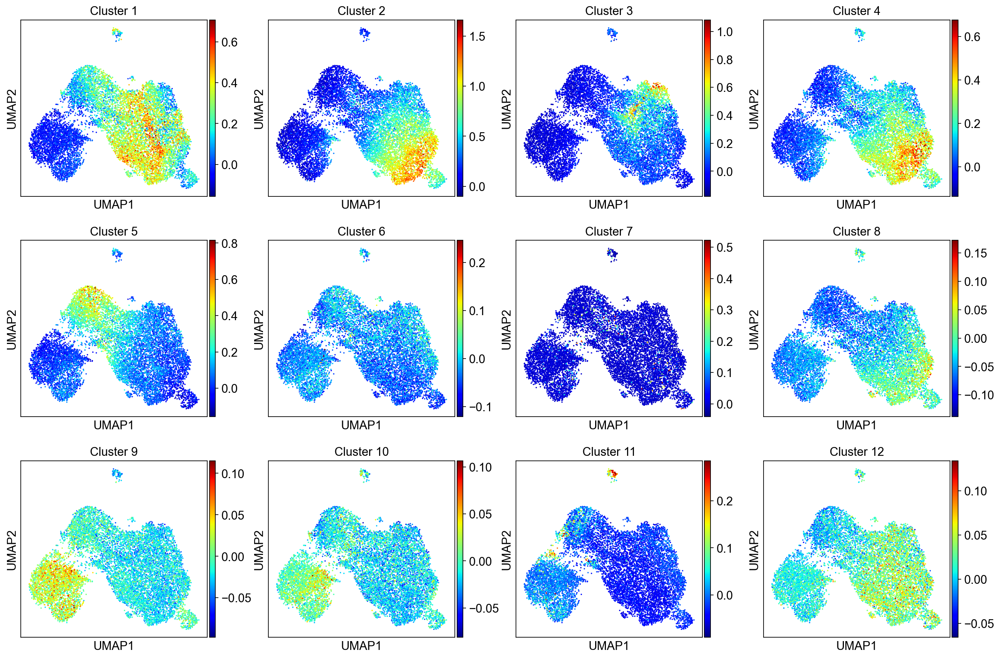

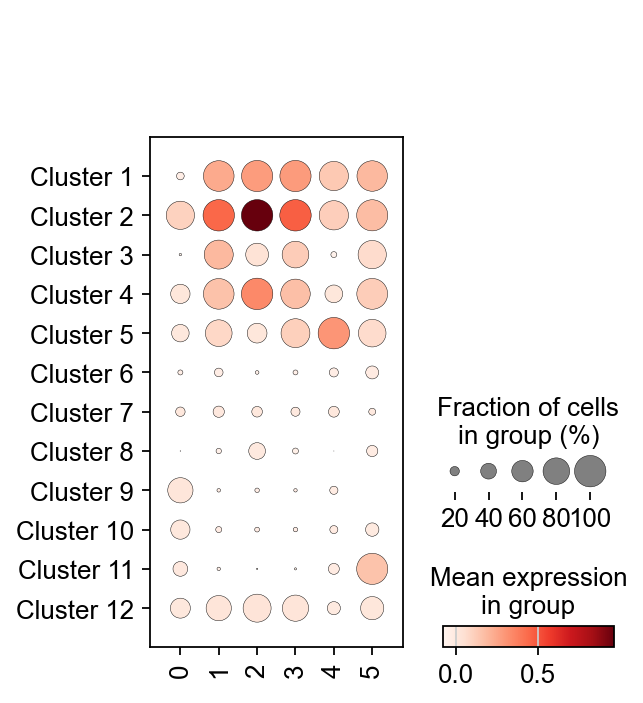

In [47]:
scoreAndPlot(adata_control, groupby='leiden',numgenes=100)

## Calculate phenotypic vollume

In [48]:
#Phenotypic Volume
def calcPV(matrix):
    if hasattr(matrix, 'toarray'):
        matrix = matrix.toarray()
    
    matrix = np.asarray(matrix, dtype=np.float64)
    gene_cov = np.cov(matrix.T)
    mat = pd.DataFrame(gene_cov)
    eig_vals = np.linalg.eigvalsh(mat)
    return(sum(np.log2(eig_vals[eig_vals > 0])))

In [49]:
from scipy.stats import mannwhitneyu

In [50]:
repeats = 1000

In [51]:
matrix = adata_control[adata_control.obs['leiden'].isin(['0']),adata_control.var['highly_variable']].X.copy()
dist1 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist1.append(calcPV(matrix[sample_id]))

In [52]:
matrix = adata_control[adata_control.obs['leiden'].isin(['4']),adata_control.var['highly_variable']].X.copy()
dist2 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist2.append(calcPV(matrix[sample_id]))

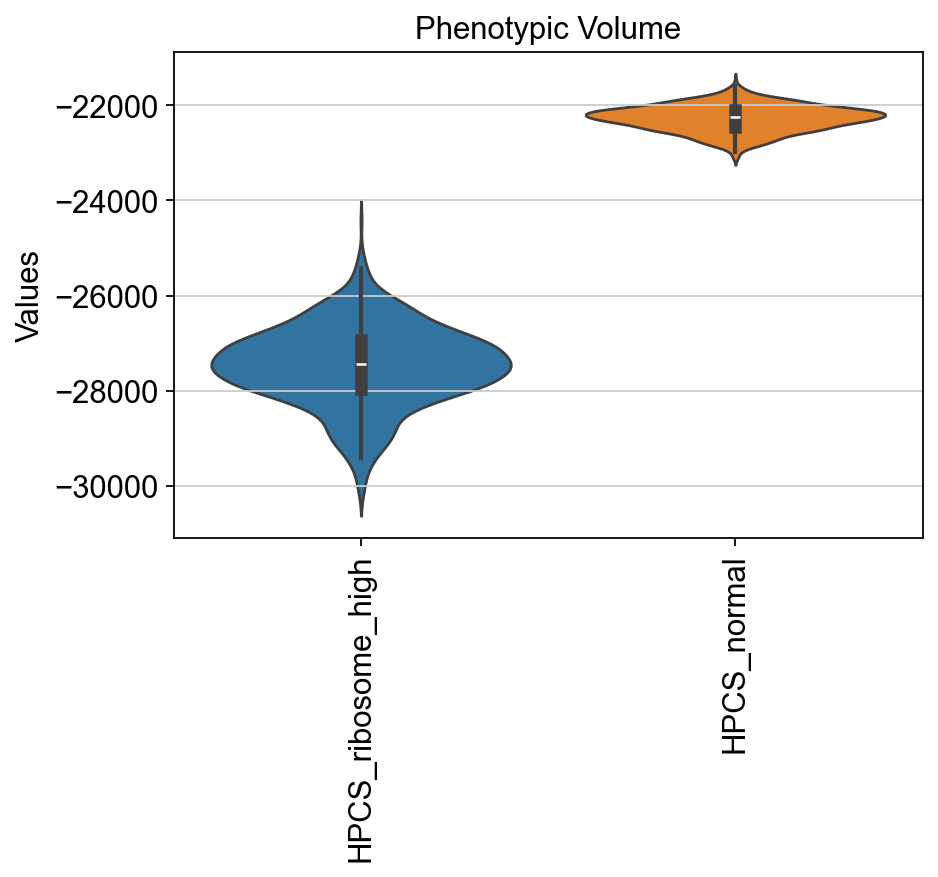

In [53]:
import seaborn as sns
data = [dist1, dist2]
labels = ["HPCS_ribosome_high", "HPCS_normal"]

# Create violin plot using Seaborn
plt.figure(figsize=(6, 4))
sns.violinplot(data=data)
plt.xticks(ticks=[0, 1], labels=labels, rotation=90)
plt.ylabel("Values")
plt.title("Phenotypic Volume")
plt.show()

## Compute PCA for perturbed samples

In [54]:
adata_perturb = adata[~adata.obs.Group.isin(['shRenilla', 'Cre']),:].copy()

In [55]:
#sc.pp.normalize_total(adata_perturb)
#sc.pp.log1p(adata_perturb)
adata_perturb = adata_perturb[:, adata_control.var_names].copy()

In [56]:
sc.tl.ingest(adata_perturb, adata_control,obs=['leiden'])

running ingest


/home/chanj2/part2a/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


    finished (0:00:12)


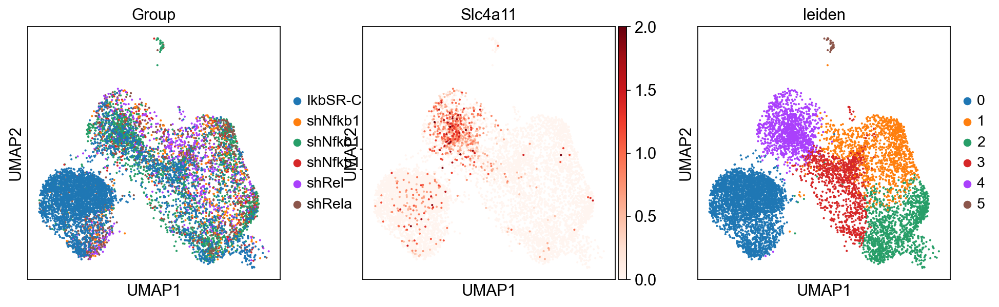

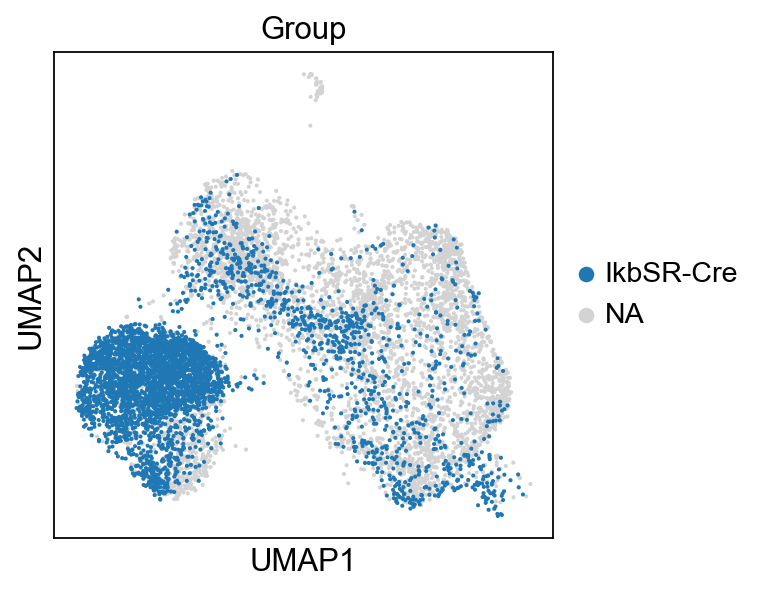

In [57]:
sc.pl.umap(adata_perturb, color=['Group','Slc4a11','leiden'],cmap='Reds',vmax=2)
sc.pl.umap(adata_perturb, color=['Group'], groups=['IkbSR-Cre'])

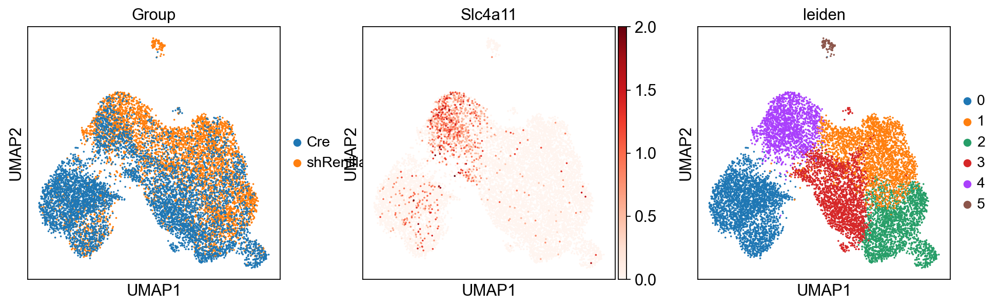

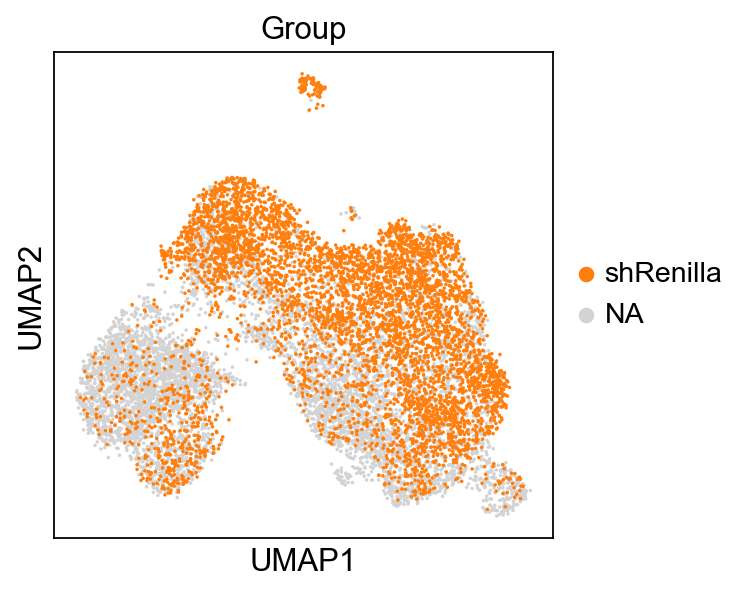

In [58]:
sc.pl.umap(adata_control, color=['Group','Slc4a11','leiden'],cmap='Reds',vmax=2)
sc.pl.umap(adata_control, color=['Group'], groups=['shRenilla'])

computing score 'Cluster 1'
    finished: added
    'Cluster 1', score of gene set (adata.obs).
    1392 total control genes are used. (0:00:00)
computing score 'Cluster 2'
    finished: added
    'Cluster 2', score of gene set (adata.obs).
    1195 total control genes are used. (0:00:00)
computing score 'Cluster 3'
    finished: added
    'Cluster 3', score of gene set (adata.obs).
    1188 total control genes are used. (0:00:00)
computing score 'Cluster 4'
    finished: added
    'Cluster 4', score of gene set (adata.obs).
    1396 total control genes are used. (0:00:00)
computing score 'Cluster 5'
    finished: added
    'Cluster 5', score of gene set (adata.obs).
    1495 total control genes are used. (0:00:00)
computing score 'Cluster 6'
    finished: added
    'Cluster 6', score of gene set (adata.obs).
    1991 total control genes are used. (0:00:00)
computing score 'Cluster 7'
    finished: added
    'Cluster 7', score of gene set (adata.obs).
    1197 total control genes are u

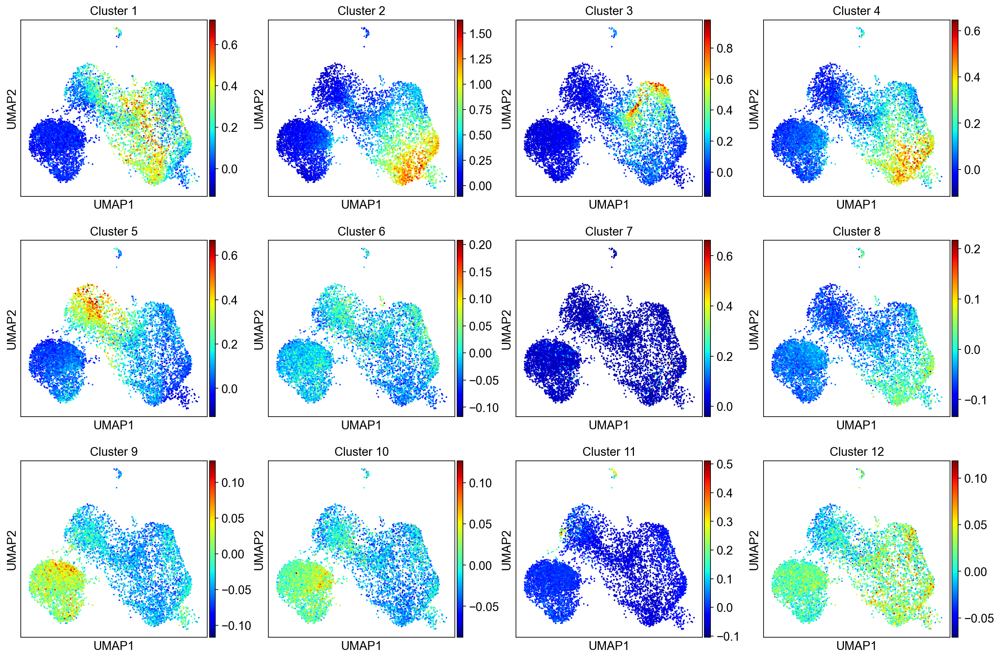

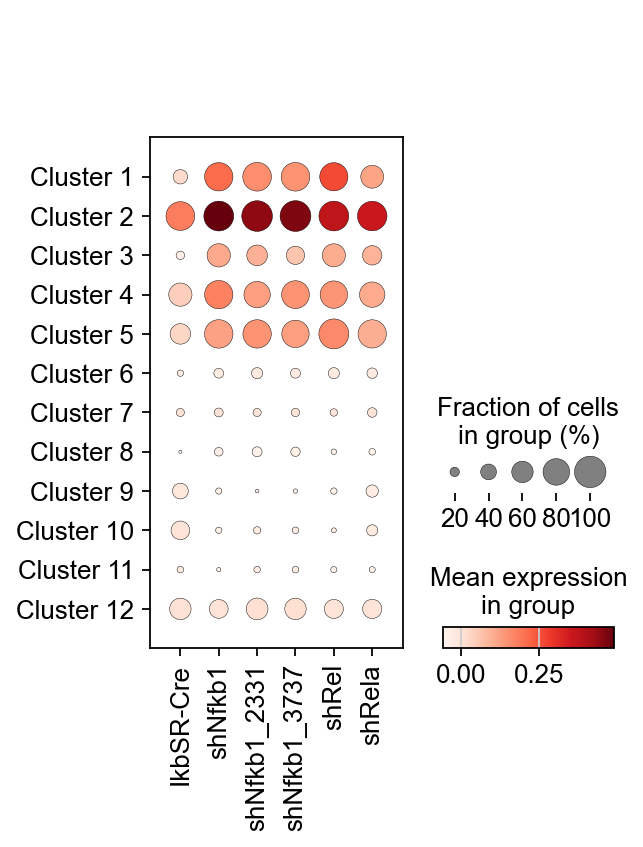

In [59]:
scoreAndPlot(adata_perturb, groupby='Group',numgenes=100)

## Look into Phenotypic Volume for Nfkb knockdowns

In [60]:
matrix = adata_perturb[adata_perturb.obs['leiden'].isin(['0']),adata_control.var['highly_variable']].X.copy()
dist3 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist3.append(calcPV(matrix[sample_id]))

In [61]:
matrix = adata_perturb[adata_perturb.obs['leiden'].isin(['4']),adata_control.var['highly_variable']].X.copy()
dist4 = []
for x in range(0,repeats):
    sample_id = np.random.choice(matrix.shape[0],100)
    dist4.append(calcPV(matrix[sample_id]))

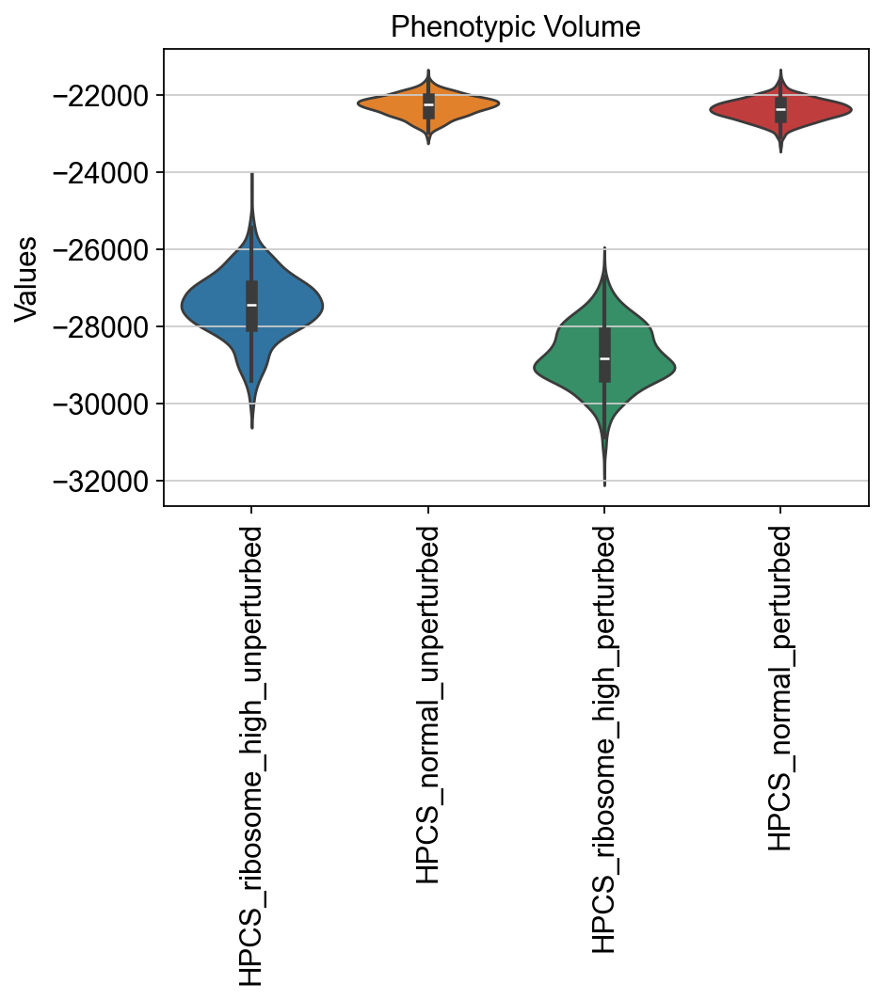

In [62]:
import seaborn as sns
data = [dist1, dist2,dist3,dist4]
labels = ["HPCS_ribosome_high_unperturbed", "HPCS_normal_unperturbed", "HPCS_ribosome_high_perturbed", "HPCS_normal_perturbed"]

# Create violin plot using Seaborn
plt.figure(figsize=(6, 4))
sns.violinplot(data=data)
plt.xticks(ticks=[0, 1,2,3], labels=labels, rotation=90)
plt.ylabel("Values")
plt.title("Phenotypic Volume")
plt.show()

## Look into proportion of cell states across conditions

In [63]:
import scanpy as sc

common = adata_control.var_names.intersection(adata_perturb.var_names)

#Manually set highly variable genes which will get lost otherwise
adata_perturb.var['highly_variable'] = False
adata_perturb.var.loc[common, 'highly_variable'] = adata_control.var.loc[common, 'highly_variable']

adata_combined = sc.concat(
    [adata_control[:,common].copy(), adata_perturb[:,common].copy()],
    label="condition",
    keys=["control", "perturb"],
    index_unique=None,  # keeps original cell barcodes readable
    merge="same"
)


In [64]:
adata_combined.uns['log1p'] = {'base': None}

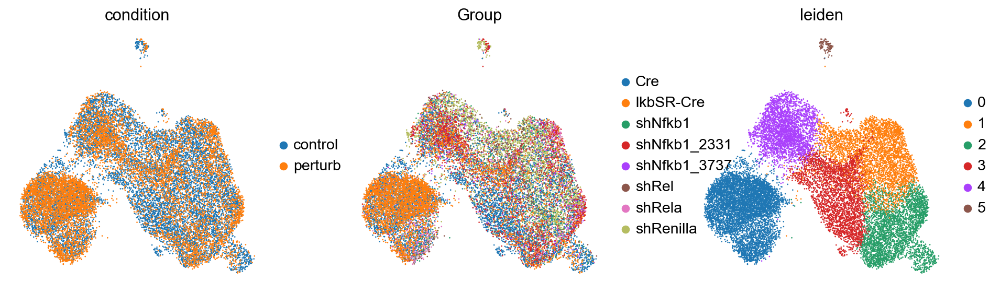

In [65]:
sc.pl.umap(
    adata_combined,
    color=["condition", "Group", "leiden"],
    frameon=False
)


In [66]:
import numpy as np

np.allclose(
    adata_control.obsm["X_umap"],
    adata_combined[adata_combined.obs.condition == "control"].obsm["X_umap"]
)


True

In [67]:
print(adata_combined.obsm.keys())


KeysView(AxisArrays with keys: X_umap, X_pca)


In [68]:
sc.tl.embedding_density(adata_combined, basis='umap', groupby='condition')

computing density on 'umap'
--> added
    'umap_density_condition', densities (adata.obs)
    'umap_density_condition_params', parameter (adata.uns)


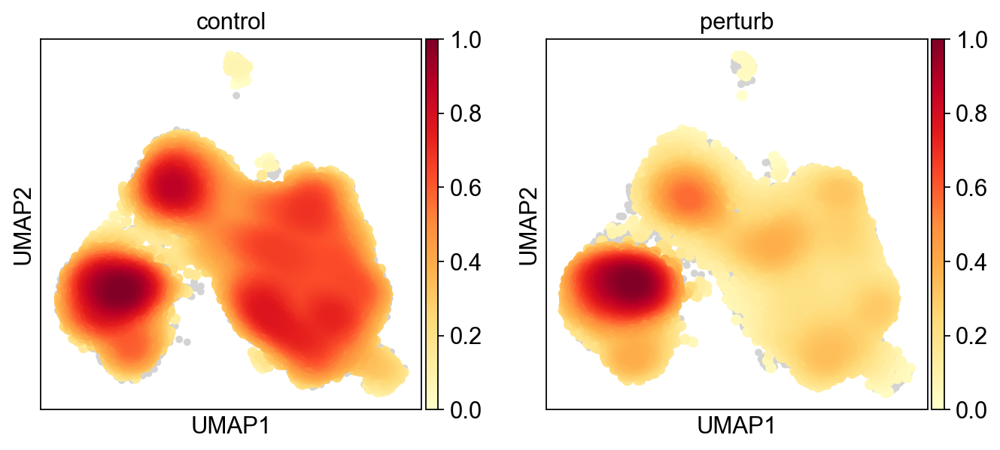

In [69]:
sc.pl.embedding_density(adata_combined, basis='umap', key='umap_density_condition')

In [70]:
sc.tl.embedding_density(adata_combined, basis='umap', groupby='Group')

computing density on 'umap'
--> added
    'umap_density_Group', densities (adata.obs)
    'umap_density_Group_params', parameter (adata.uns)


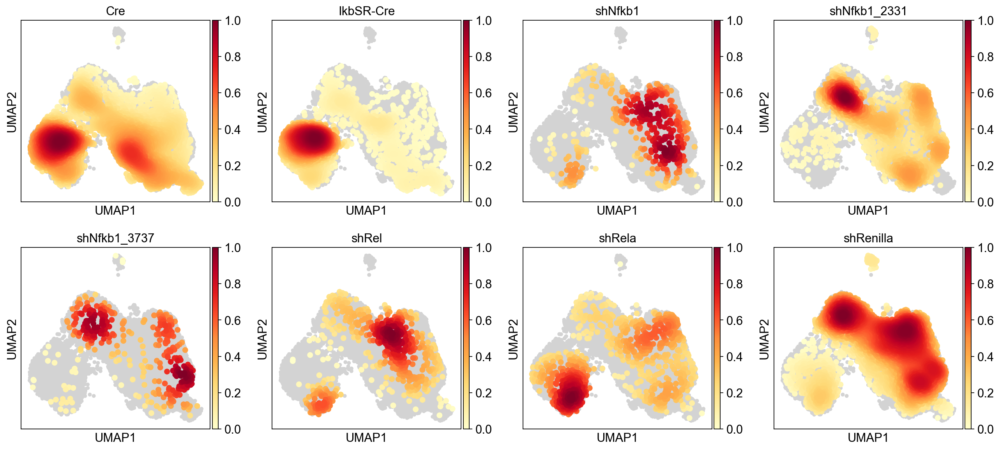

In [71]:
sc.pl.embedding_density(adata_combined, basis='umap', key='umap_density_Group')

In [72]:
adata_combined

AnnData object with n_obs × n_vars = 20327 × 30144
    obs: 'n_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log10GenesPerUMI', 'Classification', 'shRen', '2118-Nfkb1', '2117-Nfkb1', 'GFP_count', 'Cre_count', 'shRNA', 'Group', 'shRela', 'shRel', 'batch', 'leiden', 'Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Cluster 5', 'Cluster 6', 'Cluster 7', 'Cluster 8', 'Cluster 9', 'Cluster 10', 'Cluster 11', 'Cluster 12', 'condition', 'umap_density_condition', 'umap_density_Group'
    var: 'gene_ids-IkbSR-Cre', 'feature_types-IkbSR-Cre', 'genome-IkbSR-Cre', 'pattern-IkbSR-Cre', 'read-IkbSR-Cre', 'sequence-IkbSR-Cre', 'n_cells-IkbSR-Cre', 'mt-IkbSR-Cre', 'n_cells_by_counts-IkbSR-Cre', 'mean_counts-IkbSR-Cre', 'pct_dropout_by_counts-IkbSR-Cre', 'total_counts-IkbSR-Cre', 'highly_variable-IkbSR-Cre', 'means-IkbSR-Cre', 'dispersions-IkbSR-Cre', 'dispersions_norm-IkbSR-Cre', 'gene_ids-shHairpins', 'feature_types-shHairpins', 'genome-shHairpins', 

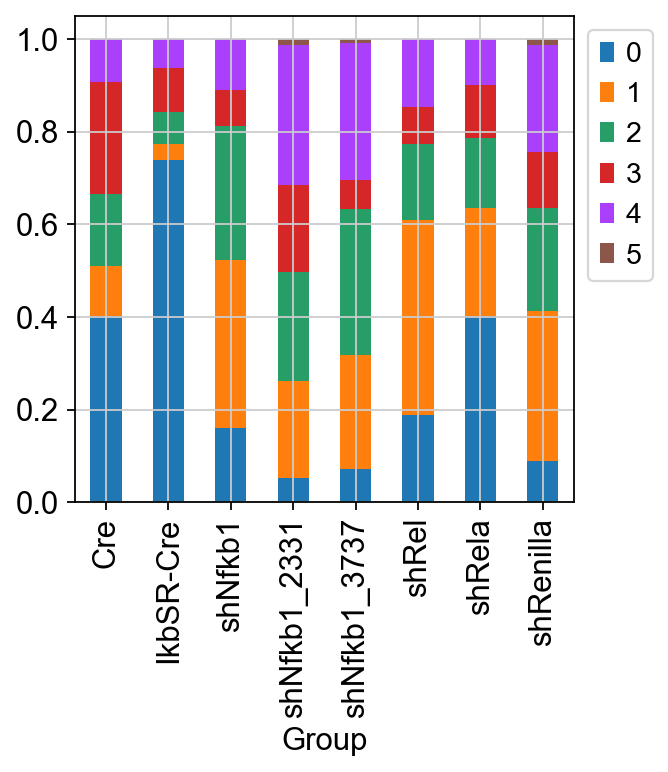

In [73]:
 cell_proportion_df = pd.crosstab(adata_combined.obs['leiden'],adata_combined.obs['Group'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

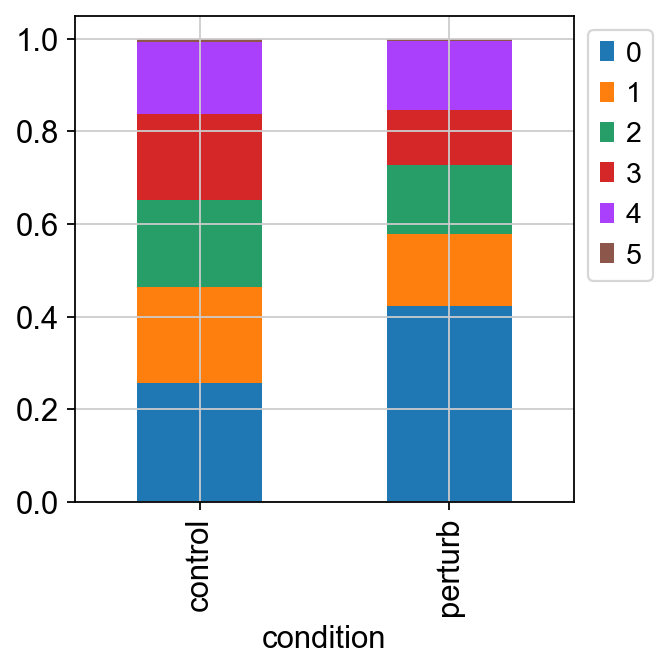

In [74]:
 cell_proportion_df = pd.crosstab(adata_combined.obs['leiden'],adata_combined.obs['condition'], normalize='columns').T.plot(kind='bar', stacked=True).legend(bbox_to_anchor=(1,1))

## Write objects

In [75]:
adata.write_h5ad(results_file, compression='gzip')

In [76]:
adata_combined.write_h5ad('write/Nfkb_combined.h5ad',compression='gzip')